# How to Train YOLOv5


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


#Install Dependencies

_(Remember to choose GPU in Runtime if not already selected. Runtime --> Change Runtime Type --> Hardware accelerator --> GPU)_

In [3]:
!git clone https://github.com/ultralytics/yolov5.git
%cd yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 15637, done.
remote: Counting objects: 100% (244/244), done.
remote: Compressing objects: 100% (147/147), done.
remote: Total 15637 (delta 123), reused 169 (delta 97), pack-reused 15393
Receiving objects: 100% (15637/15637), 14.64 MiB | 17.29 MiB/s, done.
Resolving deltas: 100% (10651/10651), done.
/content/yolov5


In [4]:
# install dependencies as necessary
!pip install -qr requirements.txt  # install dependencies (ignore errors)
import torch

from IPython.display import Image, clear_output  # to display images

# clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 kB 5.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 7.1 MB/s eta 0:00:00
Setup complete. Using torch 2.0.0+cu118 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15101MB, multi_processor_count=40)


# Download Correctly Formatted Custom Dataset 

In [5]:
!unzip /content/drive/MyDrive/data_yolo.zip -d data/

Streaming output truncated to the last 5000 lines.
  inflating: data/data_yolo/train/images/car266.jpg  
  inflating: data/data_yolo/train/images/car267.jpg  
  inflating: data/data_yolo/train/images/car268.jpg  
  inflating: data/data_yolo/train/images/car269.jpg  
  inflating: data/data_yolo/train/images/car27.jpg  
  inflating: data/data_yolo/train/images/car270.jpg  
  inflating: data/data_yolo/train/images/car272.jpg  
  inflating: data/data_yolo/train/images/car274.jpg  
  inflating: data/data_yolo/train/images/car275.jpg  
  inflating: data/data_yolo/train/images/car276.jpg  
  inflating: data/data_yolo/train/images/car277.jpg  
  inflating: data/data_yolo/train/images/car278.jpg  
  inflating: data/data_yolo/train/images/car279.jpg  
  inflating: data/data_yolo/train/images/car28.jpg  
  inflating: data/data_yolo/train/images/car280.jpg  
  inflating: data/data_yolo/train/images/car281.jpg  
  inflating: data/data_yolo/train/images/car282.jpg  
  inflating: data/data_yolo/train

In [7]:
!mv /content/yolov5/data/data_yolo/* /content/yolov5/data

In [8]:
%cat data/data.yaml

train: data/train/images
val: data/valid/images
test: data/valid/images

nc: 6
names: ['car','threewheel','bus','truck','motorbike','van']

# Train Custom YOLOv5 Detector

### Next, we'll fire off training!


Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** set the path to our yaml file
- **cfg:** specify our model configuration
- **weights:** specify a custom path to weights.
- **name:** result names
- **nosave:** only save the final checkpoint
- **cache:** cache images for faster training

In [9]:
# train yolov5s on custom data for 10 epochs
!python train.py --img 640 --batch 4 --epochs 10 --data data/data.yaml --weights yolov5s6.pt --name yolov5s_results

train: weights=yolov5s6.pt, cfg=, data=data/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=10, batch_size=4, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=yolov5s_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
requirements: /content/requirements.txt not found, check failed.
YOLOv5 🚀 v7.0-162-gc3e4e94 Python-3.10.11 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw

In [10]:
!ls

benchmarks.py	 detect.py   __pycache__       segment	       val.py
CITATION.cff	 export.py   README.md	       setup.cfg       yolov5s6.pt
classify	 hubconf.py  README.zh-CN.md   train.py
CONTRIBUTING.md  LICENSE     requirements.txt  tutorial.ipynb
data		 models      runs	       utils


# Evaluate Custom YOLOv5 Detector Performance

Training losses and performance metrics are saved to Tensorboard and also to a logfile defined above with the **--name** flag when we train. In our case, we named this `yolov5s_results`. (If given no name, it defaults to `results.txt`.) The results file is plotted as a png after training completes.

Note from Glenn: Partially completed `results.txt` files can be plotted with `from utils.utils import plot_results; plot_results()`.

In [11]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

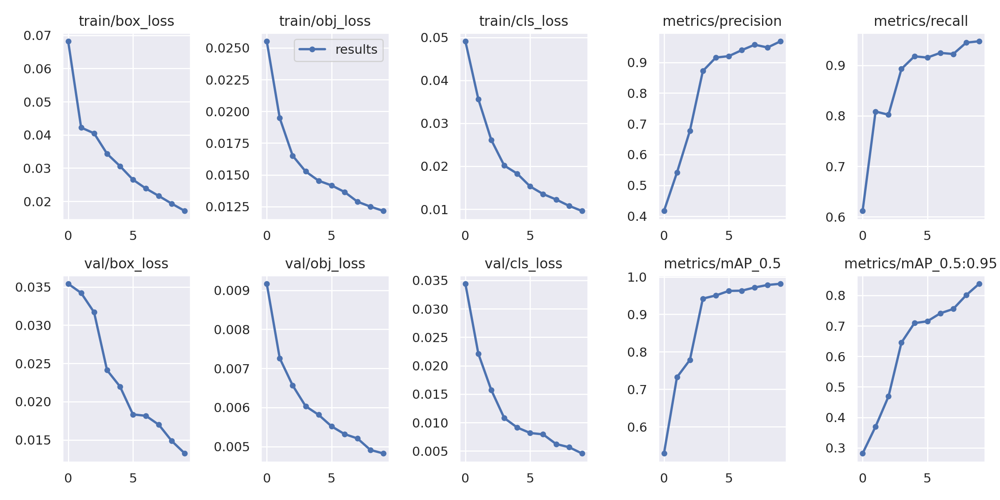

In [13]:
# we can also output some older school graphs if the tensor board isn't working for whatever reason... 
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/train/yolov5s_results/results.png', width=1000)  # view results.png

#Run Inference  With Trained Weights
Run inference with a pretrained checkpoint on contents of `test/images` folder downloaded from Roboflow.

In [14]:
# trained weights are saved by default in our weights folder
%ls /content/yolov5/runs/train/yolov5s_results/

confusion_matrix.png                                results.png
events.out.tfevents.1683460488.97dd6480ca1e.1468.0  train_batch0.jpg
F1_curve.png                                        train_batch1.jpg
hyp.yaml                                            train_batch2.jpg
labels_correlogram.jpg                              val_batch0_labels.jpg
labels.jpg                                          val_batch0_pred.jpg
opt.yaml                                            val_batch1_labels.jpg
P_curve.png                                         val_batch1_pred.jpg
PR_curve.png                                        val_batch2_labels.jpg
R_curve.png                                         val_batch2_pred.jpg
results.csv                                         weights/


In [15]:
%ls /content/yolov5/runs/train/yolov5s_results/weights/

best.pt  last.pt


In [16]:
# when we ran this, we saw .007 second inference time. That is 140 FPS on a TESLA P100!
# use the best weights!
!python detect.py --weights /content/yolov5/runs/train/yolov5s_results/weights/best.pt --img 640 --conf 0.4 --source data/test/

detect: weights=['/content/yolov5/runs/train/yolov5s_results/weights/best.pt'], source=data/test/, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
requirements: /content/requirements.txt not found, check failed.
YOLOv5 🚀 v7.0-162-gc3e4e94 Python-3.10.11 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 206 layers, 12327460 parameters, 0 gradients, 16.2 GFLOPs
image 1/12 /content/yolov5/data/test/car5.jpg: 384x640 1 car, 115.8ms
image 2/12 /content/yolov5/data/test/car75.jpg: 384x640 1 car, 9.9ms
image 3/12 /content/yolov5/data/test/lorry439.jpg: 512x640 1 truck, 81.8ms
image 4/12 /content/yolov5/data/test/srilankalor

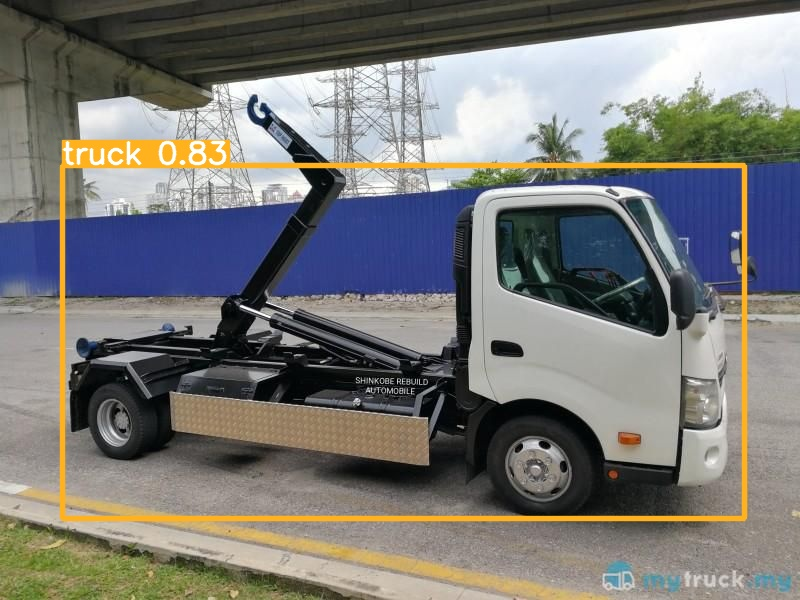

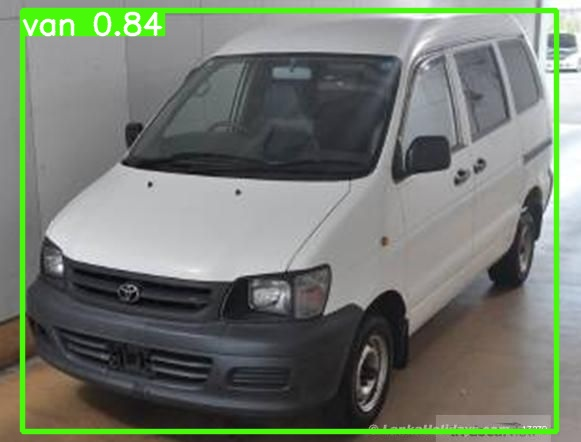

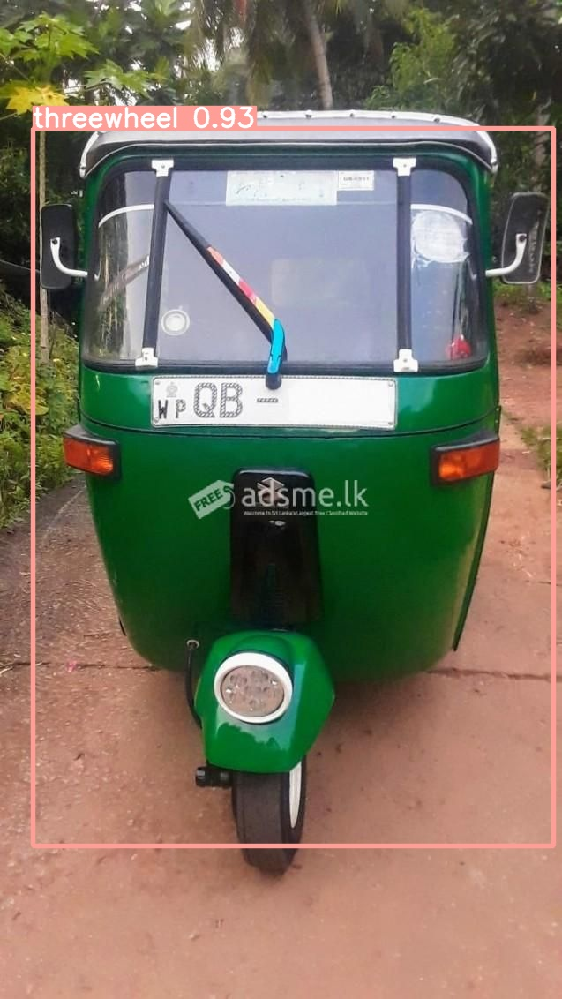

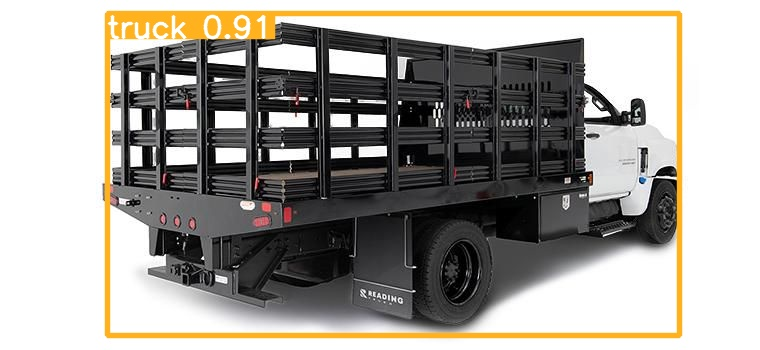

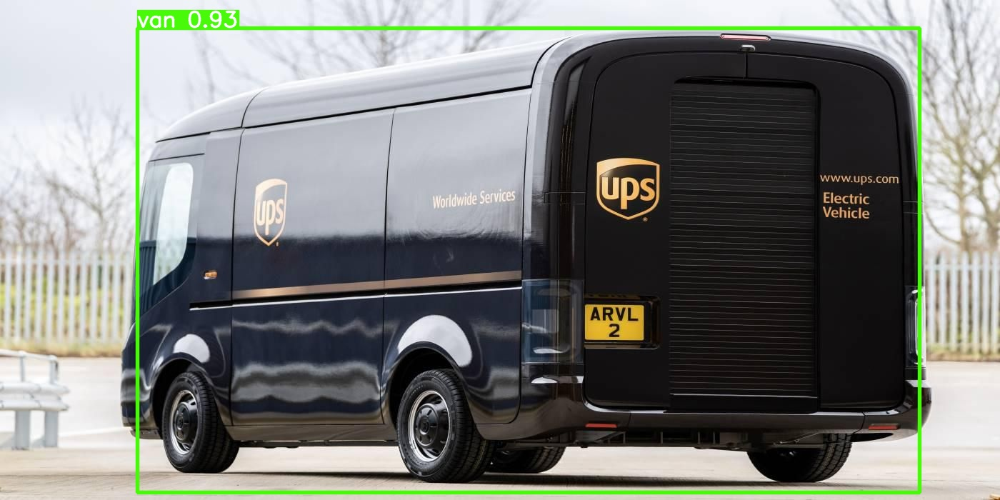

...

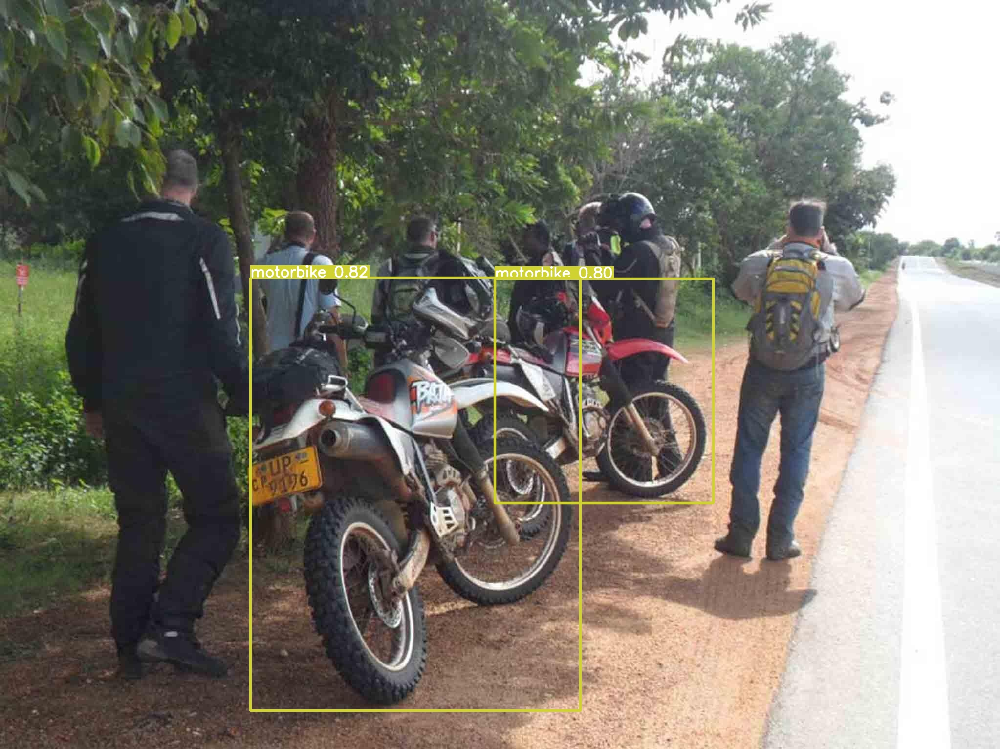

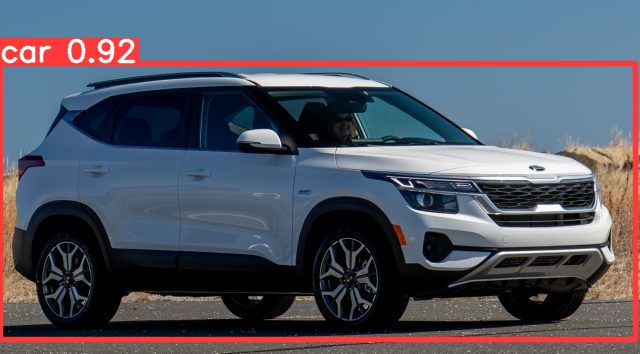

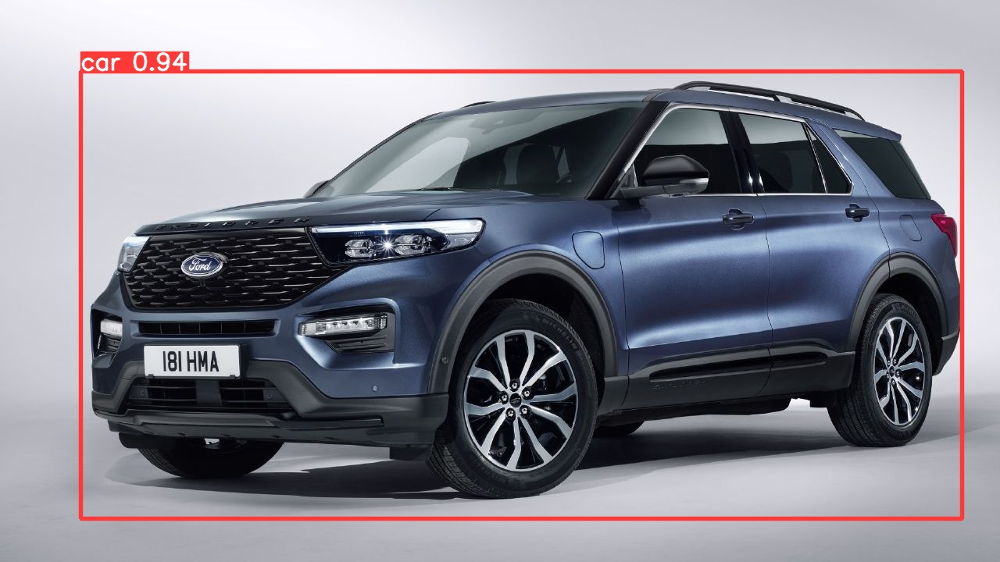

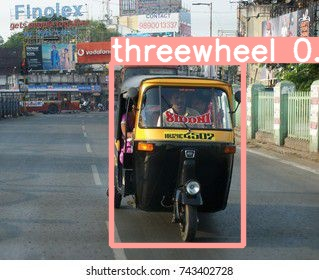

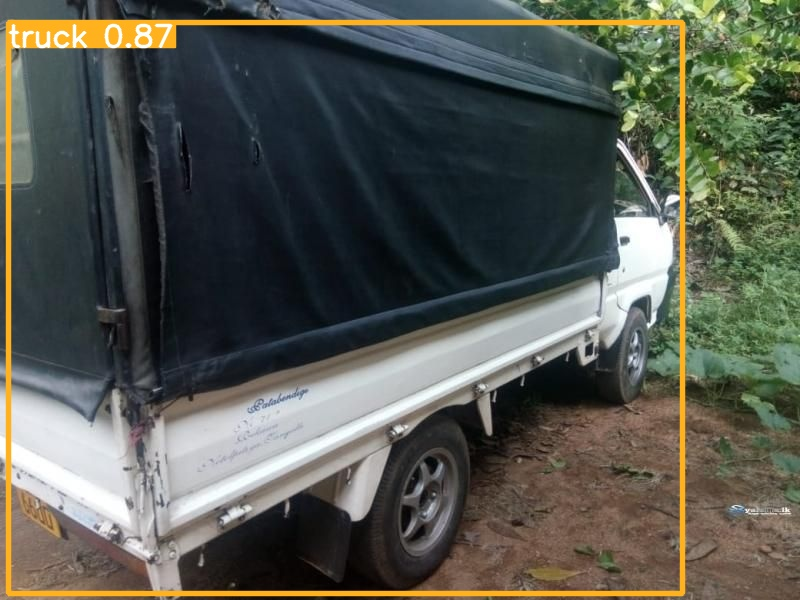

In [17]:
#display inference on ALL test images
#this looks much better with longer training above

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming png
    display(Image(filename=imageName))
    print("\n")